## 8 Frame input - 1 frame Output

In [1]:
import keras
from matplotlib import pyplot as plt
import numpy as np
import gzip
# %matplotlib inline
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.layers import Input,Conv2D,MaxPooling2D,UpSampling2D
from keras.models import Model
from keras.optimizers import RMSprop
from skimage.color import rgb2lab, lab2rgb, rgb2gray, gray2rgb
from skimage.transform import resize
from skimage.io import imsave
import numpy as np
import os
import random

import cv2
import tensorflow as tf
from keras.preprocessing import image
from keras.layers import Conv2D, UpSampling2D, InputLayer, Conv2DTranspose, Input, Reshape, concatenate
from keras.layers import Input, BatchNormalization, Dense
from keras.layers import RepeatVector, Permute
from scipy import ndimage, misc
from keras.optimizers import Adam
from keras.layers import  Flatten,Dense
from keras.initializers import RandomNormal
from keras.layers import LeakyReLU
import random
from keras.layers import Concatenate
from keras.models import load_model

from keras.layers import  Flatten,Dense


['frame1.jpg', 'frame2.jpg', 'frame3.jpg', 'frame4.jpg', 'frame5.jpg', 'frame6.jpg', 'frame7.jpg', 'frame8.jpg', 'frame9.jpg', 'frame10.jpg', 'frame11.jpg', 'frame12.jpg', 'frame13.jpg', 'frame14.jpg', 'frame15.jpg', 'frame16.jpg', 'frame17.jpg', 'frame18.jpg', 'frame19.jpg', 'frame20.jpg', 'frame21.jpg', 'frame22.jpg', 'frame23.jpg', 'frame24.jpg', 'frame25.jpg', 'frame26.jpg', 'frame27.jpg', 'frame28.jpg', 'frame29.jpg', 'frame30.jpg', 'frame31.jpg', 'frame32.jpg', 'frame33.jpg', 'frame34.jpg', 'frame35.jpg', 'frame36.jpg', 'frame37.jpg', 'frame38.jpg', 'frame39.jpg', 'frame40.jpg', 'frame41.jpg', 'frame42.jpg', 'frame43.jpg', 'frame44.jpg', 'frame45.jpg', 'frame46.jpg', 'frame47.jpg', 'frame48.jpg', 'frame49.jpg', 'frame50.jpg', 'frame51.jpg', 'frame52.jpg', 'frame53.jpg', 'frame54.jpg', 'frame55.jpg', 'frame56.jpg', 'frame57.jpg', 'frame58.jpg', 'frame59.jpg', 'frame60.jpg', 'frame61.jpg', 'frame62.jpg', 'frame63.jpg', 'frame64.jpg', 'frame65.jpg', 'frame66.jpg', 'frame67.jpg', 'fr

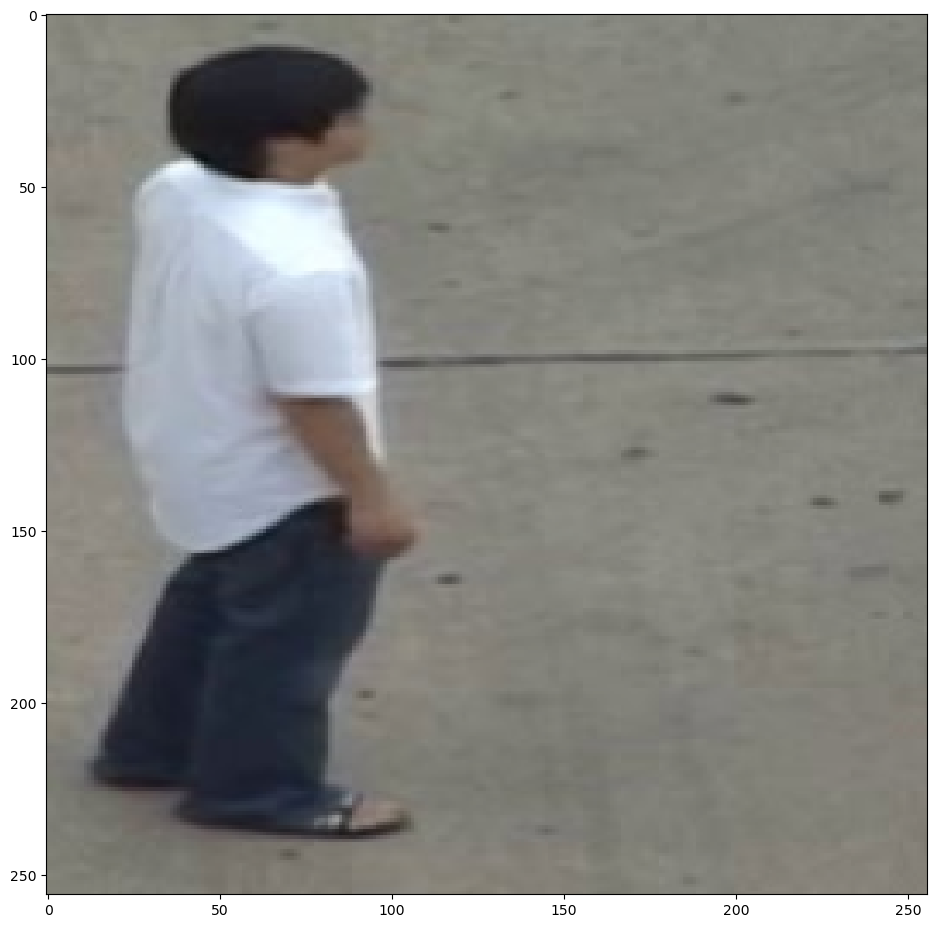

(1173, 256, 256, 3)


In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Initialize list to hold images
X = []

# Define the folder path
folder_path = r'F:\UT-Interaction\1 FPS\pointting'

# Get and sort image names based on the number in 'frame[number]'
names = sorted(os.listdir(folder_path), key=lambda x: int(x.replace('frame', '').split('.')[0]))
print(names)

# Loop through filenames and load images
for filename in names:
    # Construct full file path
    full_path = os.path.join(folder_path, filename)

    # Read the image as colored
    img = cv2.imread(full_path, cv2.IMREAD_COLOR)

    if img is None:
        print(f"Warning: Unable to load image {full_path}")
        continue

    # Convert BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Resize the image to 256x256
    dim = (256, 256)
    resized = cv2.resize(img, dim, interpolation=cv2.INTER_AREA)

    # Append resized image to list
    X.append(resized)

# Convert list to numpy array
X = np.array(X, dtype=float)

# Normalize the images
Xtrain = X / 255.0

# Check shape
print("Shape of Xtrain:", Xtrain.shape)
print(tf.__version__)

# Plot a sample image to verify colors
plt.figure(figsize=[25,25])
plt.subplot(121)
curr_img = Xtrain[0] # No need to reshape since it's already in the correct shape (256, 256, 3)
plt.imshow(curr_img)
plt.show()

# Reshape to (-1, 256, 256, 3) for the full dataset
Xtrain = Xtrain.reshape(-1, 256, 256, 3)
print(Xtrain.shape)


(1173, 256, 256, 3)
2.10.1


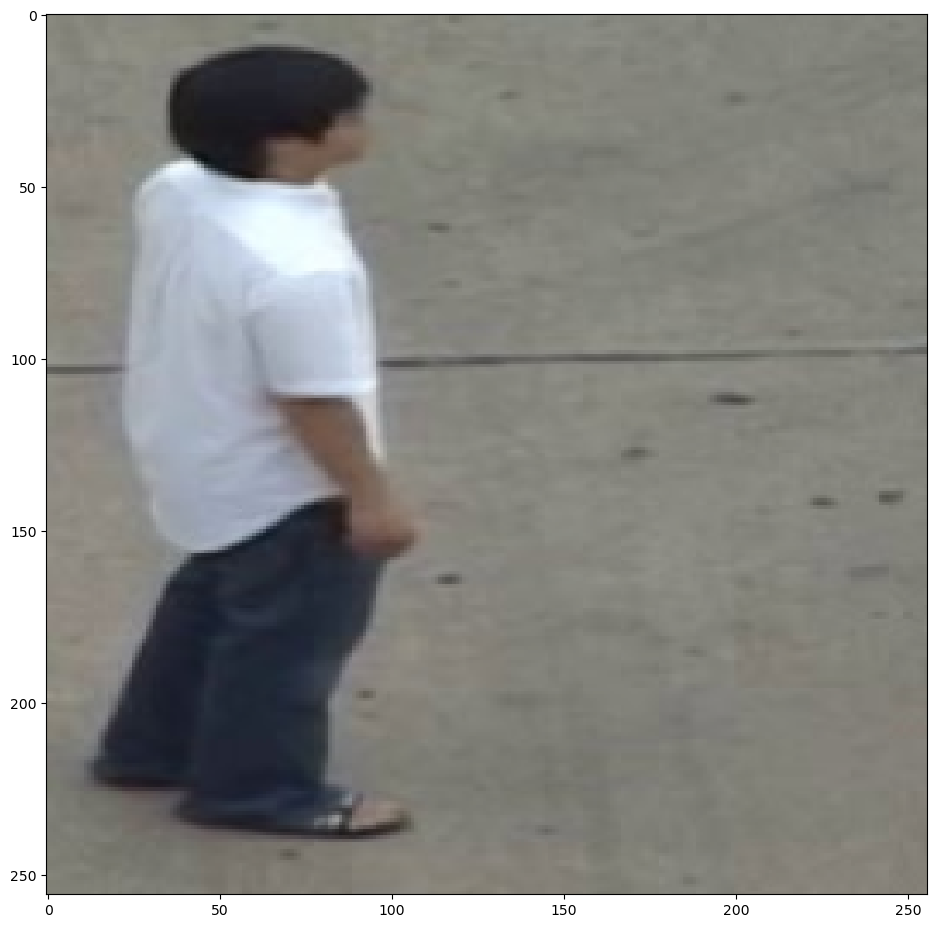

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# Assuming Xtrain contains colored images

plt.figure(figsize=[25,25])
plt.subplot(121)
curr_img = Xtrain[0] # No need to reshape since it's already in the correct shape (256, 256, 3)
# curr_lbl = train_labels[0]
plt.imshow(curr_img)
Xtrain = Xtrain.reshape(-1, 256, 256, 3) # The last dimension should be 3 for RGB images
print(Xtrain.shape)
print(tf.__version__)


In [4]:
batch_size = 1
epochs = 1000
inChannel = 3
x, y = 256, 256
input_img = Input(shape = ((x, y, inChannel)))
input_img1 = Input(shape = ((x, y, inChannel)))
input_img2 = Input(shape = ((x, y, inChannel)))
input_img3 = Input(shape = ((x, y, inChannel)))
input_img4 = Input(shape = ((x, y, inChannel)))
input_img5 = Input(shape = ((x, y, inChannel)))
input_img6 = Input(shape = ((x, y, inChannel)))
input_img7 = Input(shape = ((x, y, inChannel)))
input_img8 = Input(shape = ((x, y, inChannel)))
decoder_input= Input(shape = ((8,8,256)))

In [5]:
# Define input layers for past frames and target frames
x, y, inChannel = 256, 256, 3  # Example dimensions

input_img1 = Input(shape=(x, y, inChannel))
input_img2 = Input(shape=(x, y, inChannel))
input_img3 = Input(shape=(x, y, inChannel))
input_img4 = Input(shape=(x, y, inChannel))
input_img5 = Input(shape=(x, y, inChannel))
input_img6 = Input(shape=(x, y, inChannel))
input_img7 = Input(shape=(x, y, inChannel))
input_img8 = Input(shape=(x, y, inChannel))

target_img = Input(shape=(x, y, inChannel))

In [ ]:
#### Temporal attention based

## Running code from Laptop

from tensorflow.keras.layers import ConvLSTM2D, Conv2D, Conv2DTranspose, BatchNormalization, ReLU, Add, Concatenate, Reshape
from keras.models import Model
from keras.initializers import RandomNormal
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, LeakyReLU, Add, Concatenate, Input, GlobalAveragePooling2D, Dense, Multiply

from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Layer
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras import Model

from tensorflow.keras.layers import Layer, Conv2D
import tensorflow as tf

import tensorflow as tf
from tensorflow.keras.layers import Layer, Conv2D

from tensorflow.keras.regularizers import l2

from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, BatchNormalization, LeakyReLU, Add, Concatenate, GlobalAveragePooling2D, Dense, Multiply, ConvLSTM2D
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Model
import tensorflow as tf

def eca_attention(x, gamma=2, b=1):
    # ECA attention mechanism
    t = int(abs((tf.math.log(tf.cast(x.shape[-1], tf.float32)) / tf.math.log(2.0) + b) / gamma))
    kernel_size = t if t % 2 else t + 1  # Kernel size should be odd
    avg_pool = tf.reduce_mean(x, axis=[1, 2], keepdims=True)
    conv = Conv2D(1, kernel_size, padding='same', use_bias=False)(avg_pool)
    sigmoid = tf.nn.sigmoid(conv)
    return x * sigmoid


def temporal_attention(x):
    # Temporal attention mechanism
    time_steps = x.shape[1]
    x_mean = tf.reduce_mean(x, axis=1, keepdims=True)
    x_mean = tf.tile(x_mean, [1, time_steps, 1, 1, 1])
    x_att = tf.concat([x, x_mean], axis=-1)
    x_att = Conv2D(1, 1, padding='same', activation='sigmoid')(x_att)
    return x * x_att

from tensorflow.keras.layers import (Input, ConvLSTM2D, Conv2D, BatchNormalization,
                                     LeakyReLU, Conv2DTranspose, Reshape, Concatenate)
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Model

# Assuming `residual_block` and `eca_attention` functions are defined elsewhere

from tensorflow.keras.layers import ConvLSTM2D, BatchNormalization, LeakyReLU,TimeDistributed, Conv2D, Conv2DTranspose, Input, Concatenate, Reshape
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import tensorflow_addons as tfa
from tensorflow.keras.layers import MaxPooling1D,Conv1D

from tensorflow.keras.layers import UpSampling2D
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, LeakyReLU, Add, Conv2DTranspose, ReLU, Reshape, Concatenate, LSTM, TimeDistributed, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.regularizers import l2

def encoder(input_img1, input_img2, input_img3, input_img4, input_img5, input_img6, input_img7, input_img8):
    init = RandomNormal(stddev=0.02)

    # Reshape and concatenate the inputs
    reshaped_input1 = Reshape((1,256, 256, 3))(input_img1)  # 3 channels for color
    reshaped_input2 = Reshape((1,256, 256, 3))(input_img2)  # 3 channels for color
    reshaped_input3 = Reshape((1,256, 256, 3))(input_img3)  # 3 channels for color
    reshaped_input4 = Reshape((1,256, 256, 3))(input_img4)  # 3 channels for color
    reshaped_input5 = Reshape((1,256, 256, 3))(input_img5)  # 3 channels for color
    reshaped_input6 = Reshape((1,256, 256, 3))(input_img6)  # 3 channels for color
    reshaped_input7 = Reshape((1,256, 256, 3))(input_img7)  # 3 channels for color
    reshaped_input8 = Reshape((1,256, 256, 3))(input_img8)  # 3 channels for color
    merged = Concatenate(axis=1)([reshaped_input1, reshaped_input2, reshaped_input3, reshaped_input4, reshaped_input5, reshaped_input6, reshaped_input7, reshaped_input8])

    # Add ConvLSTM2D layer at the start
    convlstm1 = ConvLSTM2D(16, 3, strides=1, padding='same', return_sequences=True, kernel_initializer=init)(merged)
    convlstm1 = BatchNormalization()(convlstm1)
    convlstm1 = LeakyReLU(alpha=0.2)(convlstm1)
    convlstm1 = temporal_attention(convlstm1)

    # Add ConvLSTM2D layer at the start
    convlstm1 = ConvLSTM2D(32, 3, strides=1, padding='same', return_sequences=True, kernel_initializer=init)(convlstm1)
    convlstm1 = BatchNormalization()(convlstm1)
    convlstm1 = LeakyReLU(alpha=0.2)(convlstm1)
    convlstm1=temporal_attention(convlstm1)

    convlstm1 = ConvLSTM2D(32, 3, strides=1, padding='same', return_sequences=False, kernel_initializer=init)(convlstm1)
    convlstm1 = BatchNormalization()(convlstm1)
    convlstm1 = LeakyReLU(alpha=0.2)(convlstm1)

    conv11 = Conv2D(8, 3, padding='same', dilation_rate=3, kernel_initializer=init)(convlstm1)
    conv11 = BatchNormalization()(conv11)
    conv11 = LeakyReLU(alpha=0.2)(conv11)

    conv12 = Conv2D(8, 1, padding='same', dilation_rate=3, kernel_initializer=init)(convlstm1)
    conv12 = BatchNormalization()(conv12)
    conv12 = LeakyReLU(alpha=0.2)(conv12)

    conv13 = Conv2D(8, 5, padding='same', dilation_rate=3, kernel_initializer=init)(convlstm1)
    conv13 = BatchNormalization()(conv13)
    conv13 = LeakyReLU(alpha=0.2)(conv13)

    conv14 = Conv2D(8, 7, padding='same', dilation_rate=3, kernel_initializer=init)(convlstm1)
    conv14 = BatchNormalization()(conv14)
    conv14 = LeakyReLU(alpha=0.2)(conv14)

    conv1 = Add()([conv11, conv12, conv13,conv14])
    conv1 = eca_attention(conv1)

    conv21 = Conv2D(16, 3, padding='same', dilation_rate=3, kernel_initializer=init)(conv1)
    conv21 = BatchNormalization()(conv21)
    conv21 = LeakyReLU(alpha=0.2)(conv21)

    conv22 = Conv2D(16, 1, padding='same', dilation_rate=3, kernel_initializer=init)(conv1)
    conv22 = BatchNormalization()(conv22)
    conv22 = LeakyReLU(alpha=0.2)(conv22)

    conv23 = Conv2D(16, 5, padding='same', dilation_rate=3, kernel_initializer=init)(conv1)
    conv23 = BatchNormalization()(conv23)
    conv23 = LeakyReLU(alpha=0.2)(conv23)

    conv24 = Conv2D(16, 7, padding='same', dilation_rate=3, kernel_initializer=init)(conv1)
    conv24 = BatchNormalization()(conv24)
    conv24 = LeakyReLU(alpha=0.2)(conv24)

    conv2 = Add()([conv21, conv22, conv23,conv24])
    conv2 = eca_attention(conv2)
    conv2 = MaxPooling2D()(conv2)

    conv31 = Conv2D(32, 3, padding='same', dilation_rate=3, kernel_initializer=init)(conv2)
    conv31 = BatchNormalization()(conv31)
    conv31 = LeakyReLU(alpha=0.2)(conv31)

    conv32 = Conv2D(32, 1, padding='same', dilation_rate=3, kernel_initializer=init)(conv2)
    conv32 = BatchNormalization()(conv32)
    conv32 = LeakyReLU(alpha=0.2)(conv32)

    conv33 = Conv2D(32, 5, padding='same', dilation_rate=3, kernel_initializer=init)(conv2)
    conv33 = BatchNormalization()(conv33)
    conv33 = LeakyReLU(alpha=0.2)(conv33)

    conv34 = Conv2D(32, 7, padding='same', dilation_rate=3, kernel_initializer=init)(conv2)
    conv34 = BatchNormalization()(conv34)
    conv34 = LeakyReLU(alpha=0.2)(conv34)

    conv3 = Add()([conv31, conv32, conv33,conv34])
    conv3 = eca_attention(conv3)
    conv3 = MaxPooling2D()(conv3)

    conv41 = Conv2D(64, 3, padding='same', dilation_rate=3, kernel_initializer=init)(conv3)
    conv41 = BatchNormalization()(conv41)
    conv41 = LeakyReLU(alpha=0.2)(conv41)

    conv42 = Conv2D(64, 1, padding='same', dilation_rate=3, kernel_initializer=init)(conv3)
    conv42 = BatchNormalization()(conv42)
    conv42 = LeakyReLU(alpha=0.2)(conv42)

    conv43 = Conv2D(64, 5, padding='same', dilation_rate=3, kernel_initializer=init)(conv3)
    conv43 = BatchNormalization()(conv43)
    conv43 = LeakyReLU(alpha=0.2)(conv43)

    conv44 = Conv2D(64, 7, padding='same', dilation_rate=3, kernel_initializer=init)(conv3)
    conv44 = BatchNormalization()(conv44)
    conv44 = LeakyReLU(alpha=0.2)(conv44)

    conv4 = Add()([conv41, conv42, conv43,conv44])
    conv4 = eca_attention(conv4)

    conv4 = MaxPooling2D()(conv4)

    conv51 = Conv2D(128, 3, padding='same', dilation_rate=3, kernel_initializer=init)(conv4)
    conv51 = BatchNormalization()(conv51)
    conv51 = LeakyReLU(alpha=0.2)(conv51)

    conv52 = Conv2D(128, 1, padding='same', dilation_rate=3, kernel_initializer=init)(conv4)
    conv52 = BatchNormalization()(conv52)
    conv52 = LeakyReLU(alpha=0.2)(conv52)

    conv53 = Conv2D(128, 5, padding='same', dilation_rate=3, kernel_initializer=init)(conv4)
    conv53 = BatchNormalization()(conv53)
    conv53 = LeakyReLU(alpha=0.2)(conv53)

    conv54 = Conv2D(128, 7, padding='same', dilation_rate=3, kernel_initializer=init)(conv4)
    conv54 = BatchNormalization()(conv54)
    conv54 = LeakyReLU(alpha=0.2)(conv54)

    conv5 = Add()([conv51, conv52, conv53,conv54])
    conv5 = eca_attention(conv5)
    conv5 = MaxPooling2D()(conv5)

    conv61 = Conv2D(128, 3, padding='same', dilation_rate=3, kernel_initializer=init)(conv5)
    conv61 = BatchNormalization()(conv61)
    conv61 = LeakyReLU(alpha=0.2)(conv61)

    conv62 = Conv2D(128, 1, padding='same', dilation_rate=3, kernel_initializer=init)(conv5)
    conv62 = BatchNormalization()(conv62)
    conv62 = LeakyReLU(alpha=0.2)(conv62)

    conv63 = Conv2D(128, 5, padding='same', dilation_rate=3, kernel_initializer=init)(conv5)
    conv63 = BatchNormalization()(conv63)
    conv63 = LeakyReLU(alpha=0.2)(conv63)

    conv64 = Conv2D(128, 7, padding='same', dilation_rate=3, kernel_initializer=init)(conv5)
    conv64 = BatchNormalization()(conv64)
    conv64 = LeakyReLU(alpha=0.2)(conv64)

    conv6 = Add()([conv61, conv62, conv63,conv64])
    conv6 = eca_attention(conv6)
    conv6 = MaxPooling2D()(conv6)

    conv63 = Conv1D(128, 3, padding='same', kernel_initializer=init)(conv6)
    conv63 = BatchNormalization()(conv63)
    conv631 = LeakyReLU(alpha=0.2)(conv63)


    conv63 = Conv1D(128, 3, padding='same', kernel_initializer=init)(conv631)
    conv63 = BatchNormalization()(conv63)
    conv632 = LeakyReLU(alpha=0.2)(conv63)


    conv63 = Conv1D(128, 3, padding='same', kernel_initializer=init)(conv632)
    conv63 = BatchNormalization()(conv63)
    conv631 = LeakyReLU(alpha=0.2)(conv63)

    conv63 = Conv1D(128, 3, padding='same', kernel_initializer=init)(conv631)
    conv63 = BatchNormalization()(conv63)
    conv632 = LeakyReLU(alpha=0.2)(conv63)
    
    conv63 = Conv1D(128, 3, padding='same', kernel_initializer=init)(conv632)
    conv63 = BatchNormalization()(conv63)
    conv632 = LeakyReLU(alpha=0.2)(conv63)


    # Decoder with transposed convolutions and skip connections
    # First path of transposed convolutions for 128 filters
    up1_a = Conv2DTranspose(128, 4, strides=2, padding='same', kernel_initializer=init)(conv632)
    up1_a = BatchNormalization()(up1_a)
    up1_a = ReLU()(up1_a)

    combined_128 = Add()([up1_a, conv5])

    # For 64 filters
    up2_a = Conv2DTranspose(64, 4, strides=2, padding='same', kernel_initializer=init)(combined_128)
    up2_a = BatchNormalization()(up2_a)
    up2_a = ReLU()(up2_a)

    combined_64 = Add()([up2_a, conv4])

    # For 32 filters
    up3_a = Conv2DTranspose(32, 4, strides=2, padding='same', kernel_initializer=init)(combined_64)
    up3_a = BatchNormalization()(up3_a)
    up3_a = ReLU()(up3_a)

    combined_32 = Add()([up3_a, conv3])

    # For 16 filters
    up4_a = Conv2DTranspose(16, 4, strides=2, padding='same', kernel_initializer=init)(combined_32)
    up4_a = BatchNormalization()(up4_a)
    up4_a = ReLU()(up4_a)

    combined_16 = Add()([up4_a, conv2])

    # For 8 filters
    up5_a = Conv2DTranspose(8, 4, strides=2, padding='same', kernel_regularizer=l2(0.01), kernel_initializer=init)(combined_16)
    up5_a = BatchNormalization()(up5_a)
    up5_a = ReLU()(up5_a)

    combined_8 = Add()([up5_a, conv1])

    # Final output layer
    decoded = Conv2D(3, 3, activation='tanh', padding='same', kernel_initializer=init)(combined_8)

    # Create the model
    autoencoder = Model([input_img1, input_img2, input_img3, input_img4, input_img5, input_img6, input_img7, input_img8], decoded)
    return autoencoder


c:\Users\hp\anaconda3\envs\pred_env\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
c:\Users\hp\anaconda3\envs\pred_env\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.12.0 and strictly below 2.15.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.10.1 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If yo

In [7]:
print(input_img)
auto_encoder = encoder(input_img1, input_img2,input_img3,input_img4,input_img5,input_img6,input_img7,input_img8)
auto_encoder.summary()

KerasTensor(type_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='input_1'), name='input_1', description="created by layer 'input_1'")


c:\Users\hp\anaconda3\envs\pred_env\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_12 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_13 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                            

In [8]:
# temp=code([input_img1,input_img2,input_img3,input_img4])
# dec_output=decode(temp)
# auto_encoder=Model([input_img1,input_img2,input_img3,input_img4],dec_output)
opt = Adam(lr=0.0001, beta_1=0.5)
auto_encoder.compile(loss='mean_squared_error', optimizer = opt)

c:\Users\hp\anaconda3\envs\pred_env\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [9]:
train_x1 = Xtrain[:1049]   # First set of frames from index 0 to 1399
train_x2 = Xtrain[1:1050]  # Second set of frames from index 1 to 1400
train_x3 = Xtrain[2:1051]  # Third set of frames from index 2 to 1401
train_x4 = Xtrain[3:1052]  # Fourth set of frames from index 3 to 1402
train_x5 = Xtrain[4:1053]  # Fifth set of frames from index 4 to 1403
train_x6 = Xtrain[5:1054]  # Sixth set of frames from index 5 to 1404
train_x7 = Xtrain[6:1055]  # Seventh set of frames from index 6 to 1405
train_x8 = Xtrain[7:1056]  # Eighth set of frames from index 7 to 1406
y_train = Xtrain[8:1057]  # Target frames from index 8 to 1407

print(train_x1.shape)

(1049, 256, 256, 3)


In [38]:
autoencoder_train = auto_encoder.fit([train_x1,train_x2,train_x3,train_x4,train_x5,train_x6,train_x7,train_x8], y_train,epochs=300,batch_size=4,verbose=1)


Epoch 1/300
263/263 [==============================] - 156s 544ms/step - loss: 0.0150
Epoch 2/300
263/263 [==============================] - 144s 547ms/step - loss: 0.0059
Epoch 3/300
263/263 [==============================] - 144s 547ms/step - loss: 0.0042
Epoch 4/300
263/263 [==============================] - 144s 549ms/step - loss: 0.0031
Epoch 5/300
263/263 [==============================] - 146s 555ms/step - loss: 0.0027
Epoch 6/300
263/263 [==============================] - 146s 557ms/step - loss: 0.0028
Epoch 7/300
263/263 [==============================] - 145s 553ms/step - loss: 0.0025
Epoch 8/300
263/263 [==============================] - 147s 559ms/step - loss: 0.0023
Epoch 9/300
263/263 [==============================] - 147s 559ms/step - loss: 0.0022
Epoch 10/300
263/263 [==============================] - 147s 557ms/step - loss: 0.0021
Epoch 11/300
263/263 [==============================] - 147s 558ms/step - loss: 0.0020
Epoch 12/300
263/263 [==============================

In [10]:
test_x1 =Xtrain[1:9]
test_x2 =Xtrain[2:10]
test_x3 =Xtrain[3:11]
test_x4 =Xtrain[4:12]
test_x5 =Xtrain[5:13]
test_x6 =Xtrain[6:14]
test_x7 =Xtrain[7:15]
test_x8 =Xtrain[8:16]


In [40]:
pred=auto_encoder.predict([test_x1,test_x2,test_x3,test_x4,test_x5,test_x6,test_x7,test_x8])

1/1 [==============================] - 2s 2s/step


(1067, 256, 256, 3)
2.10.1


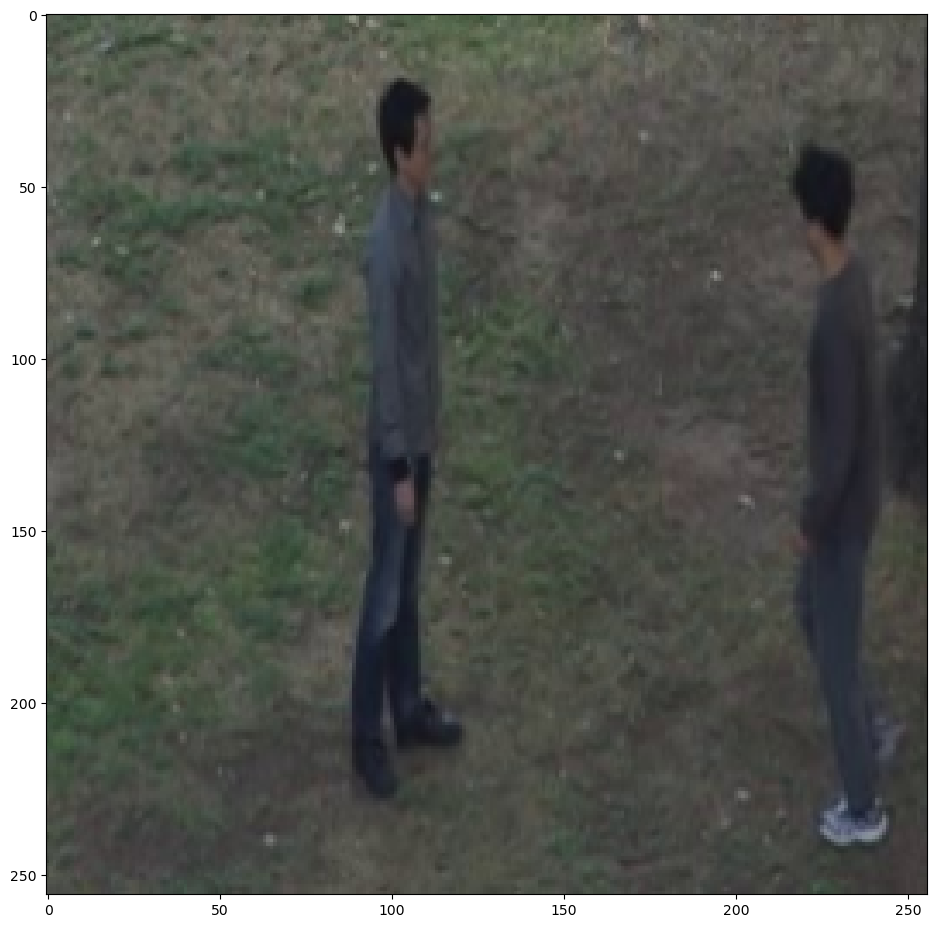

In [41]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# Assuming Xtrain contains colored images

plt.figure(figsize=[25,25])
plt.subplot(121)
curr_img = Xtrain[0] # No need to reshape since it's already in the correct shape (256, 256, 3)
# curr_lbl = train_labels[0]
plt.imshow(curr_img)
Xtrain = Xtrain.reshape(-1, 256, 256, 3) # The last dimension should be 3 for RGB images
print(Xtrain.shape)
print(tf.__version__)

In [ ]:

# # Save the model



# # Load the model
# from tensorflow.keras.models import load_model
# auto_encoder = load_model('D:/Human Activity Prediction/5th GAN/unet_input_combined_auto_encoder_KTH_wave_1000_Train.h5')


In [ ]:
auto_encoder.save('F:/5th GAN/UT-Interaction(8;1)push.h5')



In [ ]:
auto_encoder=load_model('F:/5th GAN/UT-Interaction(8;1)push.h5')

In [12]:
import pandas as pd

In [13]:
from skimage import measure
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [46]:
# # Sample usage
# X_real = Xtrain[6:10]  # Real frames (target)
# X_train = Xtrain[2:12]  # Input sequence (used for context)


In [47]:
#### compare_images(pred,X_real,"hello",X_train)

In [14]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Constants
INPUT_SHAPE = (256, 256, 3)  # Adjust according to your model's input shape
PREDICTED_FRAMES = 12  # Total number of frames to predict
INPUT_FRAMES = 8  # Number of frames used as input for each prediction

# Function to visualize frames
def visualize_frames(frames, title, ncols=5):
    num_frames = frames.shape[0]
    nrows = (num_frames + ncols - 1) // ncols  # Calculate number of rows needed
    plt.figure(figsize=(15, 5 * nrows))  # Adjust figure height based on number of rows
    for i in range(num_frames):
        plt.subplot(nrows, ncols, i + 1)
        plt.imshow(frames[i].squeeze())  # Adjust if grayscale or RGB
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

# Load the trained generator model
generator = auto_encoder  # Ensure this is defined or loaded properly

# Select initial input frames for prediction
start_index = 70  # Adjust based on dataset
test_x1 = Xtrain[start_index:start_index + INPUT_FRAMES]  # Frames 1 to 8
test_x2 = Xtrain[start_index + 1:start_index + INPUT_FRAMES + 1]  # Frames 2 to 9
test_x3 = Xtrain[start_index + 2:start_index + INPUT_FRAMES + 2]  # Frames 3 to 10
test_x4 = Xtrain[start_index + 3:start_index + INPUT_FRAMES + 3]  # Frames 4 to 11
test_x5 = Xtrain[start_index + 4:start_index + INPUT_FRAMES + 4]  # Frames 5 to 12
test_x6 = Xtrain[start_index + 5:start_index + INPUT_FRAMES + 5]  # Frames 6 to 13
test_x7 = Xtrain[start_index + 6:start_index + INPUT_FRAMES + 6]  # Frames 7 to 14
test_x8 = Xtrain[start_index + 7:start_index + INPUT_FRAMES + 7]  # Frames 8 to 15

# List to store all predicted frames
all_predicted_frames = []

# Loop to predict frames
for _ in range(PREDICTED_FRAMES):
    # Predict the next frames using the current set of input frames
    preds = generator.predict([test_x1, test_x2, test_x3, test_x4, test_x5, test_x6, test_x7, test_x8])

    # Store the predictions
    all_predicted_frames.append(preds)

    # Shift the input frames and add the new prediction
    test_x1 = np.concatenate((test_x1[1:], preds[0:1]), axis=0)
    test_x2 = np.concatenate((test_x2[1:], preds[1:2]), axis=0)
    test_x3 = np.concatenate((test_x3[1:], preds[2:3]), axis=0)
    test_x4 = np.concatenate((test_x4[1:], preds[3:4]), axis=0)
    test_x5 = np.concatenate((test_x5[1:], preds[4:5]), axis=0)
    test_x6 = np.concatenate((test_x6[1:], preds[5:6]), axis=0)
    test_x7 = np.concatenate((test_x7[1:], preds[6:7]), axis=0)
    test_x8 = np.concatenate((test_x8[1:], preds[7:8]), axis=0)

# Convert list of predicted frames to a single array
all_predicted_frames = np.concatenate(all_predicted_frames, axis=0)

# Visualize the input frames
visualize_frames(Xtrain[start_index:start_index + INPUT_FRAMES], "Input Frames (t to t+7)", ncols=8)
visualize_frames(all_predicted_frames, "Predicted Frames (t+8 to t+19)", ncols=5)


1/1 [==============================] - 15s 15s/step


ValueError: all the input arrays must have same number of dimensions, but the array at index 0 has 4 dimension(s) and the array at index 1 has 5 dimension(s)

#8 input : 8 predicted & output frames

1/1 [==============================] - 0s 366ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0073655434..0.94595534].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048336066..0.9457874].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.017037522..0.9467844].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013629918..0.9472373].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.01993325..0.9455463].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.025307644..0.94653827].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got ra

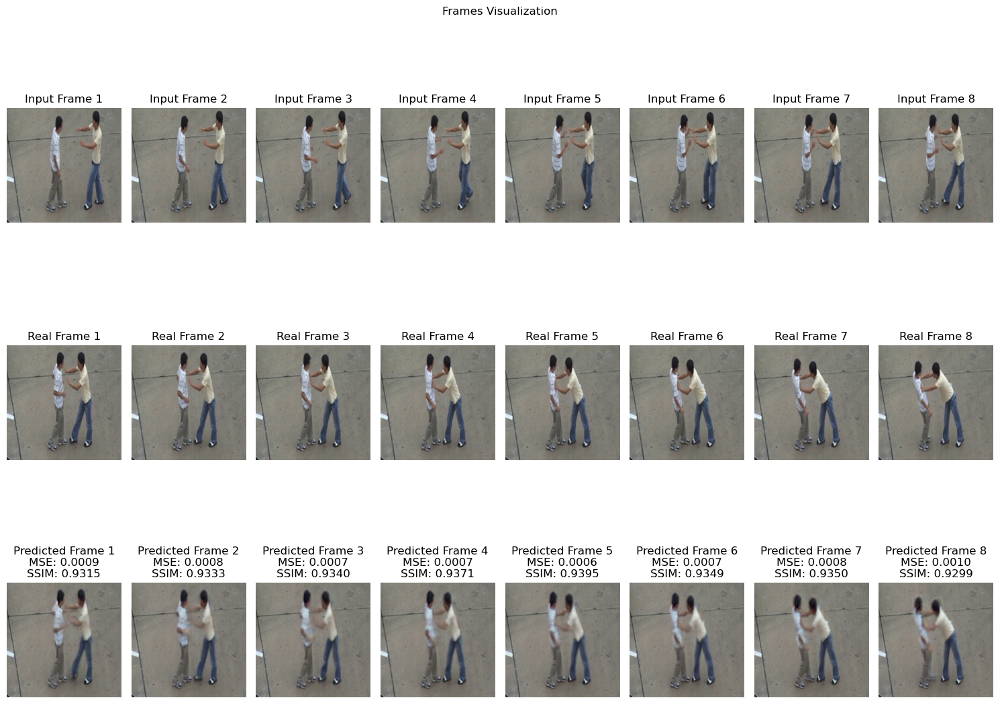

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

# Constants
INPUT_SHAPE = (256, 256, 3)  # Adjust according to your model's input shape (height, width, channels)
PREDICTED_FRAMES = 8  # Number of frames to predict
INPUT_FRAMES = 8  # Number of frames used as input for each prediction

# Function to calculate MSE
def calculate_mse(predicted, real):
    return np.mean((predicted - real) ** 2)

# Function to calculate SSIM
def calculate_ssim(predicted, real):
    return ssim(
        real.squeeze(),
        predicted.squeeze(),
        data_range=real.max() - real.min(),
        win_size=3  # Set a smaller value for smaller images
    )

# Function to visualize frames in a different layout
def visualize_frames_differently(input_frames, predicted_frames, real_frames, title):
    num_frames = predicted_frames.shape[0]
    plt.figure(figsize=(15, 12))

    # Display input frames
    for i in range(INPUT_FRAMES):
        plt.subplot(3, num_frames, i + 1)
        plt.imshow(input_frames[i].squeeze(), cmap='gray')
        plt.title(f'Input Frame {i + 1}')
        plt.axis('off')

    # Display real frames
    for i in range(num_frames):
        plt.subplot(3, num_frames, num_frames + i + 1)
        plt.imshow(real_frames[i].squeeze(), cmap='gray')
        plt.title(f'Real Frame {i + 1}')
        plt.axis('off')

    # Display predicted frames with MSE and SSIM
    for i in range(num_frames):
        plt.subplot(3, num_frames, 2 * num_frames + i + 1)
        plt.imshow(predicted_frames[i].squeeze(), cmap='gray')

        mse_value = calculate_mse(predicted_frames[i], real_frames[i])
        ssim_value = calculate_ssim(predicted_frames[i], real_frames[i])

        plt.title(f'Predicted Frame {i + 1}\nMSE: {mse_value:.4f}\nSSIM: {ssim_value:.4f}')
        plt.axis('off')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Load the saved model, passing the custom layer
# generator = load_model('D:/Human Activity Prediction/5th GAN/unet_input_combined_auto_encoder_KTH_wave_1000_Train.h5')
generator = auto_encoder

# Select input frames for prediction
start_index = 70  # Adjust this based on the frames you want to predict from
test_x1 = Xtrain[start_index:start_index + INPUT_FRAMES]  # Frames 54 to 61
test_x2 = Xtrain[start_index + 1:start_index + INPUT_FRAMES + 1]  # Frames 55 to 62
test_x3 = Xtrain[start_index + 2:start_index + INPUT_FRAMES + 2]  # Frames 56 to 63
test_x4 = Xtrain[start_index + 3:start_index + INPUT_FRAMES + 3]  # Frames 57 to 64
test_x5 = Xtrain[start_index + 4:start_index + INPUT_FRAMES + 4]  # Frames 58 to 65
test_x6 = Xtrain[start_index + 5:start_index + INPUT_FRAMES + 5]  # Frames 59 to 66
test_x7 = Xtrain[start_index + 6:start_index + INPUT_FRAMES + 6]  # Frames 60 to 67
test_x8 = Xtrain[start_index + 7:start_index + INPUT_FRAMES + 7]  # Frames 61 to 68

# Predict frames
predicted_frames = generator.predict([test_x1, test_x2, test_x3, test_x4, test_x5, test_x6, test_x7, test_x8])

# Select real next frames (ground truth frames) for comparison
real_frames = Xtrain[start_index + INPUT_FRAMES:start_index + INPUT_FRAMES + PREDICTED_FRAMES]  # Real frames 62 to 69

# Visualize the input frames, predicted frames with metrics, and real frames
visualize_frames_differently(test_x1, predicted_frames, real_frames, "Frames Visualization")


## Prediction of next **10** frames (8 frames : 1 frame)

1/1 [==============================] - 0s 92ms/step


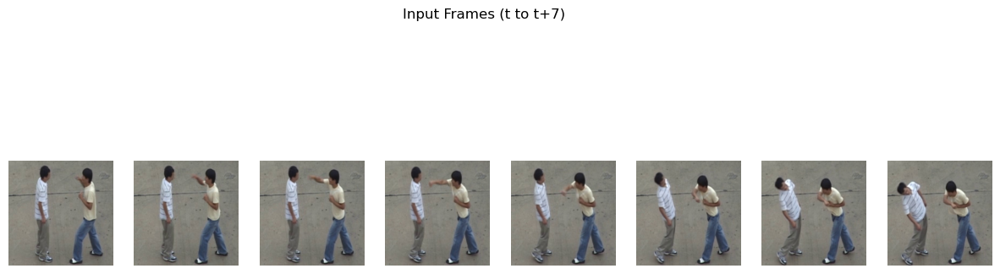

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2290734e-05..1.566039e-05].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.1959949e-05..1.5226328e-05].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0708013e-05..1.41227565e-05].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.778632e-06..1.2423635e-05].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.406088e-06..1.0150185e-05].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.0585035e-06..7.625285e-06].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or

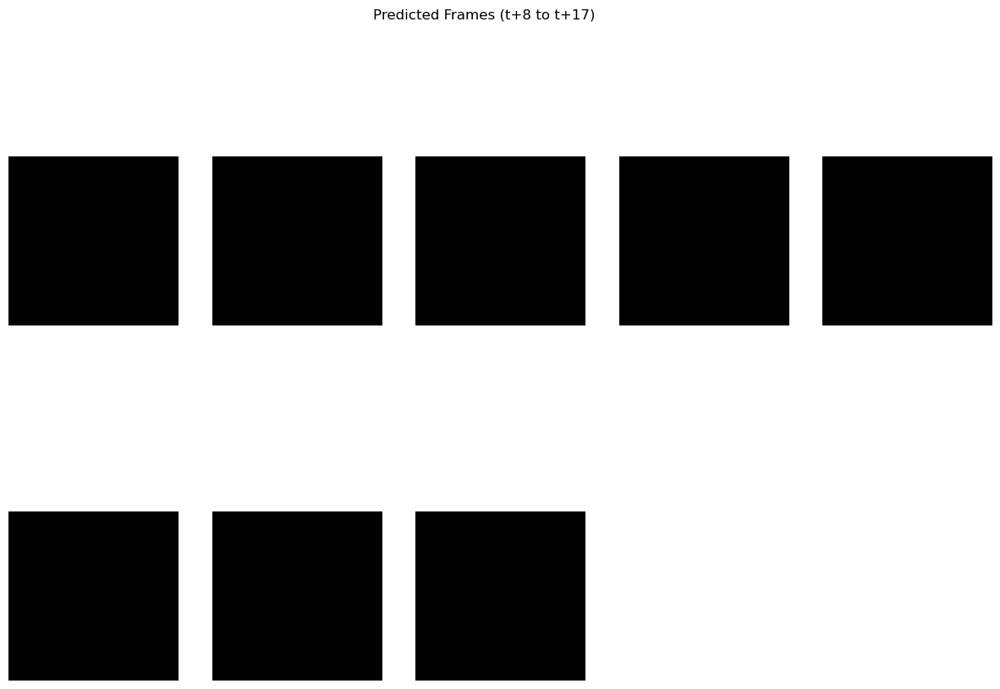

In [17]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Constants
INPUT_SHAPE = (256, 256, 3)  # Adjust according to your model's input shape (height, width, channels)
PREDICTED_FRAMES = 8  # Total number of frames to predict
INPUT_FRAMES = 8  # Number of frames used as input for each prediction

# Load the training data (assuming it's already loaded in Xtrain)
# Xtrain should be shaped (num_samples, height, width, channels)
# For example: Xtrain = np.random.rand(100, 256, 256, 1)  # Replace with your actual data

# Function to visualize frames
def visualize_frames(frames, title, ncols=5):
    num_frames = frames.shape[0]
    nrows = (num_frames + ncols - 1) // ncols  # Calculate number of rows needed
    plt.figure(figsize=(15, 5 * nrows))  # Adjust figure height based on number of rows
    for i in range(num_frames):
        plt.subplot(nrows, ncols, i + 1)
        plt.imshow(frames[i].squeeze())
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

from tensorflow.keras.models import load_model

# generator = load_model('D:/Human Activity Prediction/5th GAN/unet_input_combined_auto_encoder_KTH_wave_1000_Train.h5')

generator = auto_encoder

# Now the model is loaded and ready for use

# Select initial input frames for prediction
start_index = 195  # Adjust this based on the frames you want to predict from
initial_frames = Xtrain[start_index:start_index + INPUT_FRAMES]  # Frames 201 to 208

# List to store all predicted frames
all_predicted_frames = []

# Loop to predict frames
for _ in range(PREDICTED_FRAMES):
    # Predict the next frame using the current set of input frames
    preds = generator.predict([initial_frames[0:1], initial_frames[1:2], initial_frames[2:3], initial_frames[3:4],
                               initial_frames[4:5], initial_frames[5:6], initial_frames[6:7], initial_frames[7:8]])

    # Store the predictions
    all_predicted_frames.append(preds)

    # Shift the input frames and add the new prediction
    initial_frames = np.concatenate((initial_frames[1:], preds), axis=0)

# Convert list of predicted frames to a single array
all_predicted_frames = np.concatenate(all_predicted_frames, axis=0)

# Visualize the input frames
visualize_frames(Xtrain[start_index:start_index + INPUT_FRAMES], "Input Frames (t to t+7)", ncols=8)  # Visualize the initial input frames
visualize_frames(all_predicted_frames, "Predicted Frames (t+8 to t+17)", ncols=5)  # Show the predicted frames


1/1 [==============================] - 0s 103ms/step


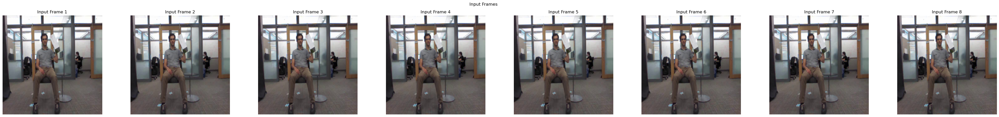

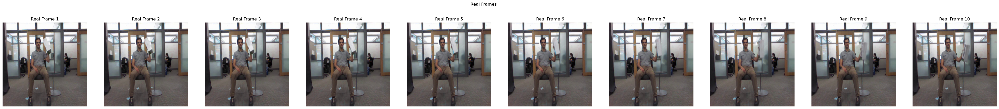

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009545326..0.9943806].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.021832515..0.9946948].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036016285..0.99446034].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.050996073..0.9944206].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06459292..0.9938885].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07560285..0.9935969].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range

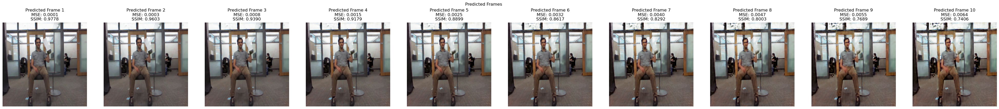

In [29]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

# Constants
INPUT_SHAPE = (256, 256, 3)  # Adjust according to your model's input shape (height, width, channels)
INPUT_SEQUENCE_LENGTH = 8  # Number of input frames
PREDICTED_FRAMES = 10  # Number of frames to predict

# Function to calculate MSE
def calculate_mse(predicted, real):
    return np.mean((predicted - real) ** 2)

# Function to calculate SSIM
def calculate_ssim(predicted, real):
    return ssim(
        real.squeeze(),
        predicted.squeeze(),
        data_range=real.max() - real.min(),
        win_size=3  # Set a smaller value for smaller images
    )

# Function to visualize frames
def visualize_frames(input_frames, predicted_frames, real_frames, title):
    num_frames = predicted_frames.shape[0]

    # Display input frames
    plt.figure(figsize=(50, 5))
    for i in range(len(input_frames)):
        plt.subplot(1, len(input_frames), i + 1)
        plt.imshow(input_frames[i].squeeze(), cmap='gray')
        plt.title(f'Input Frame {i + 1}')
        plt.axis('off')
    plt.suptitle('Input Frames')
    plt.show()

    # Display real frames
    plt.figure(figsize=(50, 5))
    for i in range(num_frames):
        plt.subplot(1, num_frames, i + 1)
        plt.imshow(real_frames[i].squeeze(), cmap='gray')
        plt.title(f'Real Frame {i + 1}')
        plt.axis('off')
    plt.suptitle('Real Frames')
    plt.show()

    # Display predicted frames with MSE and SSIM
    plt.figure(figsize=(50, 5))
    for i in range(num_frames):
        plt.subplot(1, num_frames, i + 1)
        plt.imshow(predicted_frames[i].squeeze(), cmap='gray')

        mse_value = calculate_mse(predicted_frames[i], real_frames[i])
        ssim_value = calculate_ssim(predicted_frames[i], real_frames[i])

        plt.title(f'Predicted Frame {i + 1}\nMSE: {mse_value:.4f}\nSSIM: {ssim_value:.4f}')
        plt.axis('off')
    plt.suptitle('Predicted Frames')
    plt.show()

# Load the saved model
generator = auto_encoder  # Replace with actual model if needed

# Select input frames for prediction
start_index = 5  # Adjust this based on the frames you want to predict from
initial_frames = Xtrain[start_index:start_index + INPUT_SEQUENCE_LENGTH]  # Frames 400 to 407

# Ensure correct input format for prediction
input_sequence = [np.expand_dims(frame, axis=0) for frame in initial_frames]  # Shape: (8, 1, 256, 256, 3)

# Predict the next 10 frames
all_predicted_frames = []
for _ in range(PREDICTED_FRAMES):
    preds = generator.predict(input_sequence)
    all_predicted_frames.extend(preds)
    input_sequence = input_sequence[1:] + [np.expand_dims(preds[0], axis=0)]


# Convert list to NumPy array
all_predicted_frames = np.array(all_predicted_frames)

# Select real next frames (ground truth frames) for comparison
real_frames = Xtrain[start_index + INPUT_SEQUENCE_LENGTH:start_index + INPUT_SEQUENCE_LENGTH + PREDICTED_FRAMES]  # Real frames 408 to 417

# Visualize the input frames, predicted frames, and real frames
visualize_frames(initial_frames, all_predicted_frames, real_frames, "Frames Visualization")


## Prediction of next **15** frames (8 frames : 1 frame)

1/1 [==============================] - 0s 91ms/step


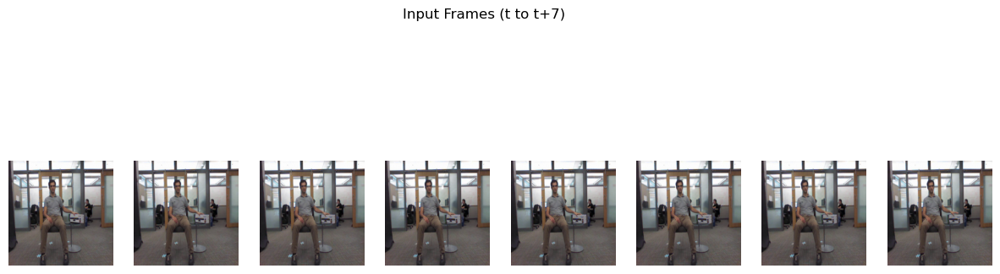

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00472621..0.99446654].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.019087235..0.9946403].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03424801..0.9950481].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.049903773..0.9948111].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06615187..0.9945634].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08116747..0.99405766].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range 

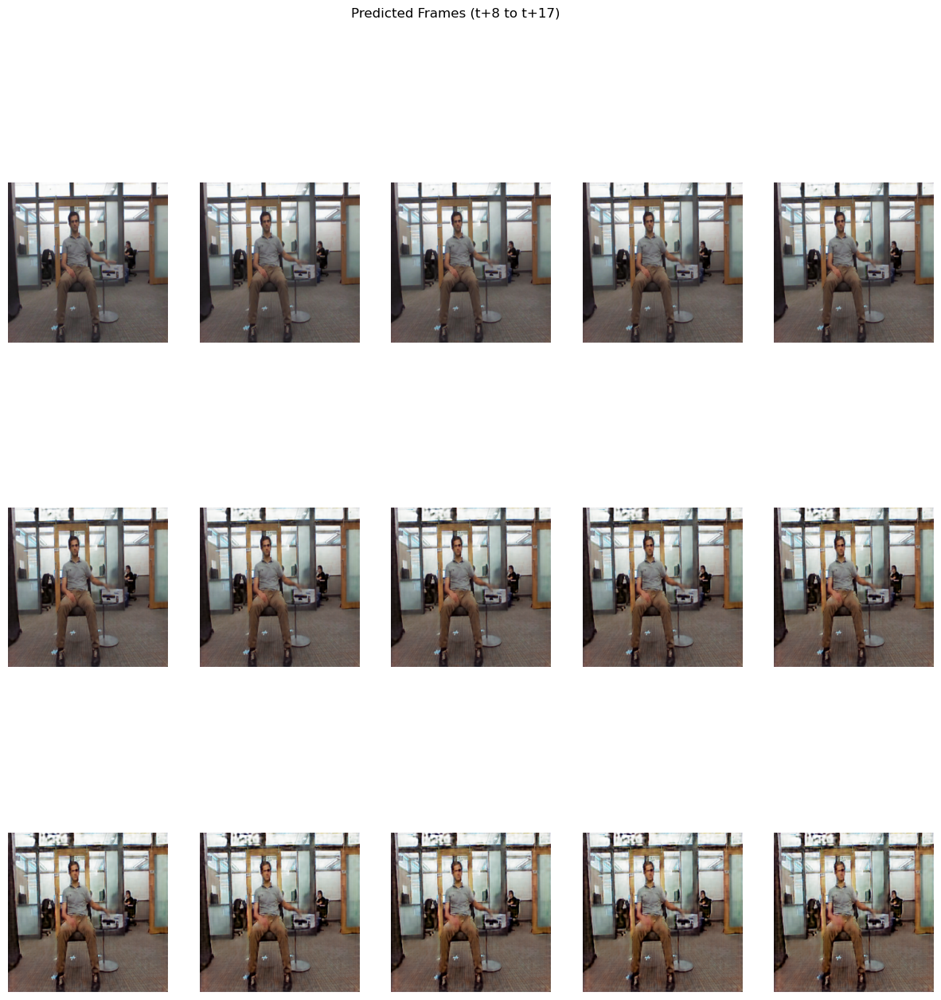

In [22]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Constants
INPUT_SHAPE = (256, 256, 3)  # Adjust according to your model's input shape (height, width, channels)
PREDICTED_FRAMES = 15  # Total number of frames to predict
INPUT_FRAMES = 8  # Number of frames used as input for each prediction

# Load the training data (assuming it's already loaded in Xtrain)
# Xtrain should be shaped (num_samples, height, width, channels)
# For example: Xtrain = np.random.rand(100, 256, 256, 1)  # Replace with your actual data

# Function to visualize frames
def visualize_frames(frames, title, ncols=5):
    num_frames = frames.shape[0]
    nrows = (num_frames + ncols - 1) // ncols  # Calculate number of rows needed
    plt.figure(figsize=(15, 5 * nrows))  # Adjust figure height based on number of rows
    for i in range(num_frames):
        plt.subplot(nrows, ncols, i + 1)
        plt.imshow(frames[i].squeeze())
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

from tensorflow.keras.models import load_model

# generator = load_model('D:/Human Activity Prediction/5th GAN/unet_input_combined_auto_encoder_KTH_wave_1000_Train.h5')

generator = auto_encoder

# Now the model is loaded and ready for use

# Select initial input frames for prediction
start_index = 101  # Adjust this based on the frames you want to predict from
initial_frames = Xtrain[start_index:start_index + INPUT_FRAMES]  # Frames 201 to 208

# List to store all predicted frames
all_predicted_frames = []

# Loop to predict frames
for _ in range(PREDICTED_FRAMES):
    # Predict the next frame using the current set of input frames
    preds = generator.predict([initial_frames[0:1], initial_frames[1:2], initial_frames[2:3], initial_frames[3:4],
                               initial_frames[4:5], initial_frames[5:6], initial_frames[6:7], initial_frames[7:8]])

    # Store the predictions
    all_predicted_frames.append(preds)

    # Shift the input frames and add the new prediction
    initial_frames = np.concatenate((initial_frames[1:], preds), axis=0)

# Convert list of predicted frames to a single array
all_predicted_frames = np.concatenate(all_predicted_frames, axis=0)

# Visualize the input frames
visualize_frames(Xtrain[start_index:start_index + INPUT_FRAMES], "Input Frames (t to t+7)", ncols=8)  # Visualize the initial input frames
visualize_frames(all_predicted_frames, "Predicted Frames (t+8 to t+17)", ncols=5)  # Show the predicted frames


1/1 [==============================] - 0s 111ms/step


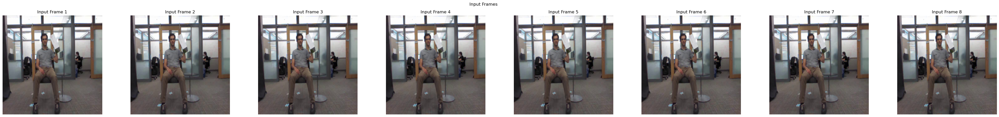

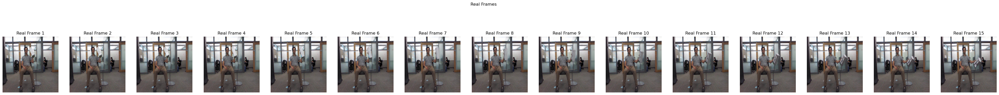

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009545326..0.9943806].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.021832515..0.9946948].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036016285..0.99446034].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.050996073..0.9944206].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06459292..0.9938885].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07560285..0.9935969].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range

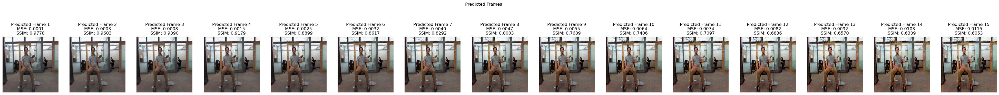

In [30]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

# Constants
INPUT_SHAPE = (256, 256, 3)  # Adjust according to your model's input shape (height, width, channels)
INPUT_SEQUENCE_LENGTH = 8  # Number of input frames
PREDICTED_FRAMES = 15  # Number of frames to predict

# Function to calculate MSE
def calculate_mse(predicted, real):
    return np.mean((predicted - real) ** 2)

# Function to calculate SSIM
def calculate_ssim(predicted, real):
    return ssim(
        real.squeeze(),
        predicted.squeeze(),
        data_range=real.max() - real.min(),
        win_size=3  # Set a smaller value for smaller images
    )

# Function to visualize frames
def visualize_frames(input_frames, predicted_frames, real_frames, title):
    num_frames = predicted_frames.shape[0]

    # Display input frames
    plt.figure(figsize=(50, 5))
    for i in range(len(input_frames)):
        plt.subplot(1, len(input_frames), i + 1)
        plt.imshow(input_frames[i].squeeze(), cmap='gray')
        plt.title(f'Input Frame {i + 1}')
        plt.axis('off')
    plt.suptitle('Input Frames')
    plt.show()

    # Display real frames
    plt.figure(figsize=(50, 5))
    for i in range(num_frames):
        plt.subplot(1, num_frames, i + 1)
        plt.imshow(real_frames[i].squeeze(), cmap='gray')
        plt.title(f'Real Frame {i + 1}')
        plt.axis('off')
    plt.suptitle('Real Frames')
    plt.show()

    # Display predicted frames with MSE and SSIM
    plt.figure(figsize=(50, 5))
    for i in range(num_frames):
        plt.subplot(1, num_frames, i + 1)
        plt.imshow(predicted_frames[i].squeeze(), cmap='gray')

        mse_value = calculate_mse(predicted_frames[i], real_frames[i])
        ssim_value = calculate_ssim(predicted_frames[i], real_frames[i])

        plt.title(f'Predicted Frame {i + 1}\nMSE: {mse_value:.4f}\nSSIM: {ssim_value:.4f}')
        plt.axis('off')
    plt.suptitle('Predicted Frames')
    plt.show()

# Load the saved model
generator = auto_encoder  # Replace with actual model if needed

# Select input frames for prediction
start_index = 5  # Adjust this based on the frames you want to predict from
initial_frames = Xtrain[start_index:start_index + INPUT_SEQUENCE_LENGTH]  # Frames 400 to 407

# Ensure correct input format for prediction
input_sequence = [np.expand_dims(frame, axis=0) for frame in initial_frames]  # Shape: (8, 1, 256, 256, 3)

# Predict the next 10 frames
all_predicted_frames = []
for _ in range(PREDICTED_FRAMES):
    preds = generator.predict(input_sequence)
    all_predicted_frames.extend(preds)
    input_sequence = input_sequence[1:] + [np.expand_dims(preds[0], axis=0)]

# Convert list to NumPy array
all_predicted_frames = np.array(all_predicted_frames)

# Select real next frames (ground truth frames) for comparison
real_frames = Xtrain[start_index + INPUT_SEQUENCE_LENGTH:start_index + INPUT_SEQUENCE_LENGTH + PREDICTED_FRAMES]  # Real frames 408 to 417

# Visualize the input frames, predicted frames, and real frames
visualize_frames(initial_frames, all_predicted_frames, real_frames, "Frames Visualization")


## Prediction of next **20** frames (8 frames : 1 frame)

1/1 [==============================] - 0s 95ms/step


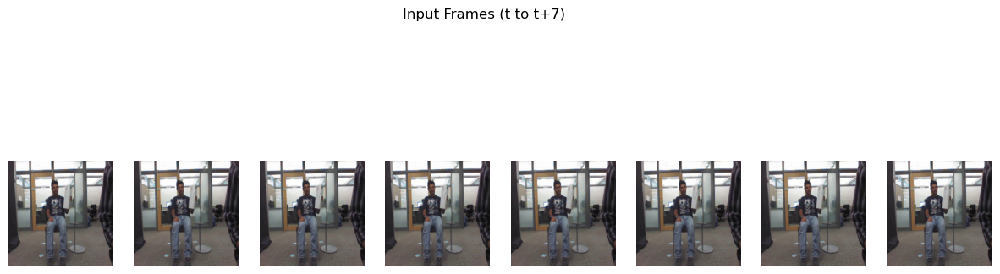

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008663276..0.9944414].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.020293506..0.99489206].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.034682915..0.99431956].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.046613783..0.9946663].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06216784..0.9946994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0752738..0.99486464].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got rang

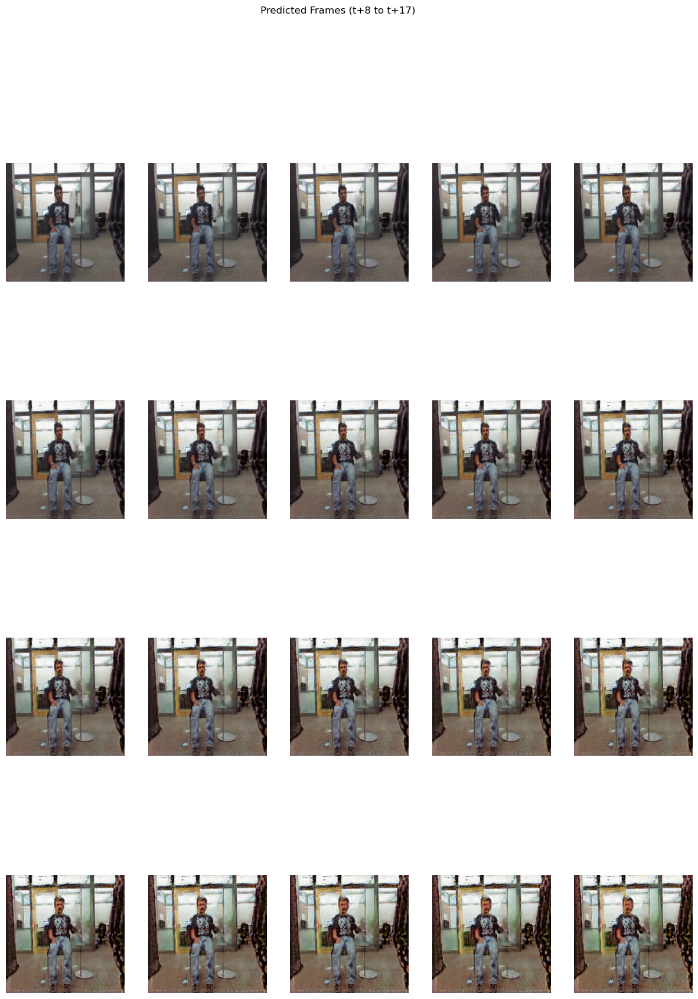

In [24]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Constants
INPUT_SHAPE = (256, 256, 3)  # Adjust according to your model's input shape (height, width, channels)
PREDICTED_FRAMES = 20  # Total number of frames to predict
INPUT_FRAMES = 8  # Number of frames used as input for each prediction

# Load the training data (assuming it's already loaded in Xtrain)
# Xtrain should be shaped (num_samples, height, width, channels)
# For example: Xtrain = np.random.rand(100, 256, 256, 1)  # Replace with your actual data

# Function to visualize frames
def visualize_frames(frames, title, ncols=5):
    num_frames = frames.shape[0]
    nrows = (num_frames + ncols - 1) // ncols  # Calculate number of rows needed
    plt.figure(figsize=(15, 5 * nrows))  # Adjust figure height based on number of rows
    for i in range(num_frames):
        plt.subplot(nrows, ncols, i + 1)
        plt.imshow(frames[i].squeeze())
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

from tensorflow.keras.models import load_model

# generator = load_model('D:/Human Activity Prediction/5th GAN/unet_input_combined_auto_encoder_KTH_wave_1000_Train.h5')

generator = auto_encoder

# Now the model is loaded and ready for use

# Select initial input frames for prediction
start_index = 201  # Adjust this based on the frames you want to predict from
initial_frames = Xtrain[start_index:start_index + INPUT_FRAMES]  # Frames 201 to 208

# List to store all predicted frames
all_predicted_frames = []

# Loop to predict frames
for _ in range(PREDICTED_FRAMES):
    # Predict the next frame using the current set of input frames
    preds = generator.predict([initial_frames[0:1], initial_frames[1:2], initial_frames[2:3], initial_frames[3:4],
                               initial_frames[4:5], initial_frames[5:6], initial_frames[6:7], initial_frames[7:8]])

    # Store the predictions
    all_predicted_frames.append(preds)

    # Shift the input frames and add the new prediction
    initial_frames = np.concatenate((initial_frames[1:], preds), axis=0)

# Convert list of predicted frames to a single array
all_predicted_frames = np.concatenate(all_predicted_frames, axis=0)

# Visualize the input frames
visualize_frames(Xtrain[start_index:start_index + INPUT_FRAMES], "Input Frames (t to t+7)", ncols=8)  # Visualize the initial input frames
visualize_frames(all_predicted_frames, "Predicted Frames (t+8 to t+17)", ncols=5)  # Show the predicted frames


1/1 [==============================] - 0s 119ms/step


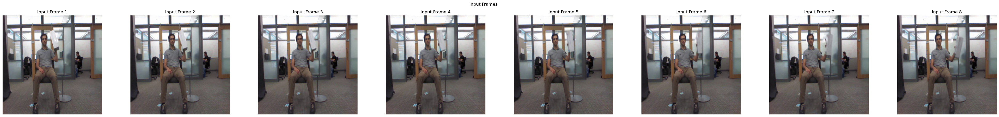

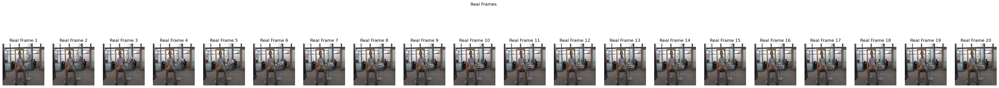

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.010661268..0.99286145].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024563482..0.9933483].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.037124664..0.9947197].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047534183..0.994381].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06368062..0.99318916].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08058252..0.99291974].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got rang

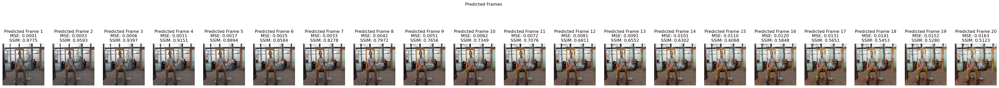

In [25]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

# Constants
INPUT_SHAPE = (256, 256, 3)  # Adjust according to your model's input shape (height, width, channels)
INPUT_SEQUENCE_LENGTH = 8  # Number of input frames
PREDICTED_FRAMES = 20  # Number of frames to predict

# Function to calculate MSE
def calculate_mse(predicted, real):
    return np.mean((predicted - real) ** 2)

# Function to calculate SSIM
def calculate_ssim(predicted, real):
    return ssim(
        real.squeeze(),
        predicted.squeeze(),
        data_range=real.max() - real.min(),
        win_size=3  # Set a smaller value for smaller images
    )

# Function to visualize frames
def visualize_frames(input_frames, predicted_frames, real_frames, title):
    num_frames = predicted_frames.shape[0]

    # Display input frames
    plt.figure(figsize=(50, 5))
    for i in range(len(input_frames)):
        plt.subplot(1, len(input_frames), i + 1)
        plt.imshow(input_frames[i].squeeze(), cmap='gray')
        plt.title(f'Input Frame {i + 1}')
        plt.axis('off')
    plt.suptitle('Input Frames')
    plt.show()

    # Display real frames
    plt.figure(figsize=(50, 5))
    for i in range(num_frames):
        plt.subplot(1, num_frames, i + 1)
        plt.imshow(real_frames[i].squeeze(), cmap='gray')
        plt.title(f'Real Frame {i + 1}')
        plt.axis('off')
    plt.suptitle('Real Frames')
    plt.show()

    # Display predicted frames with MSE and SSIM
    plt.figure(figsize=(50, 5))
    for i in range(num_frames):
        plt.subplot(1, num_frames, i + 1)
        plt.imshow(predicted_frames[i].squeeze(), cmap='gray')

        mse_value = calculate_mse(predicted_frames[i], real_frames[i])
        ssim_value = calculate_ssim(predicted_frames[i], real_frames[i])

        plt.title(f'Predicted Frame {i + 1}\nMSE: {mse_value:.4f}\nSSIM: {ssim_value:.4f}')
        plt.axis('off')
    plt.suptitle('Predicted Frames')
    plt.show()

# Load the saved model
generator = auto_encoder  # Replace with actual model if needed

# Select input frames for prediction
start_index = 150  # Adjust this based on the frames you want to predict from
initial_frames = Xtrain[start_index:start_index + INPUT_SEQUENCE_LENGTH]  # Frames 400 to 407

# Ensure correct input format for prediction
input_sequence = [np.expand_dims(frame, axis=0) for frame in initial_frames]  # Shape: (8, 1, 256, 256, 3)

# Predict the next 10 frames
all_predicted_frames = []
for _ in range(PREDICTED_FRAMES):
    preds = generator.predict(input_sequence)
    all_predicted_frames.extend(preds)
    input_sequence = input_sequence[1:] + [np.expand_dims(preds[0], axis=0)]

# Convert list to NumPy array
all_predicted_frames = np.array(all_predicted_frames)

# Select real next frames (ground truth frames) for comparison
real_frames = Xtrain[start_index + INPUT_SEQUENCE_LENGTH:start_index + INPUT_SEQUENCE_LENGTH + PREDICTED_FRAMES]  # Real frames 408 to 417

# Visualize the input frames, predicted frames, and real frames
visualize_frames(initial_frames, all_predicted_frames, real_frames, "Frames Visualization")
